**Part 1- Feature extraction**

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import imutils
from google.colab.patches import cv2_imshow
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# Download Haar Cascades if not present
import os
if not os.path.exists('/content/haarcascade_frontalface_default.xml'):
    !wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml -P /content/
if not os.path.exists('/content/haarcascade_eye.xml'):
    !wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_eye.xml -P /content/

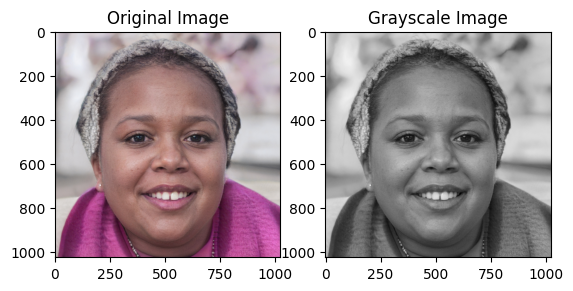

In [2]:
# Read the original image pic1 and create a regular plus a gray version of it.
# The result should be similar to what you see in instrcutions
f = plt.figure()
img_rgb = cv2.imread('/content/pic1.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

f.add_subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)) # Convert BGR to RGB for matplotlib
plt.title('Original Image')

f.add_subplot(1, 2, 2)
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

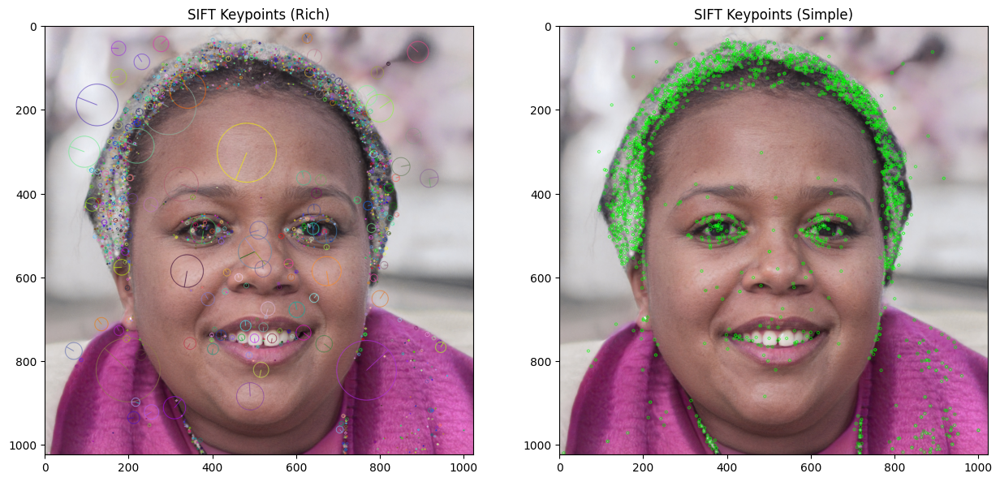

In [3]:
#a- SIFT
sift = cv2.xfeatures2d.SIFT_create()
# Find detect and compute function and apply it on top of sift
original_keypoints, original_descriptor = sift.detectAndCompute(img_gray, None)
keypoints_with_size = np.copy(img_rgb)
keypoints_without_size = np.copy(img_rgb)

# Draw the result here
result1 = cv2.drawKeypoints(img_rgb, original_keypoints, keypoints_with_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
result2 = cv2.drawKeypoints(img_rgb, original_keypoints, keypoints_without_size, color=(0, 255, 0))

plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(result1, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints (Rich)')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(result2, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints (Simple)')
plt.show()

In [22]:
# Explain your understanding here?
# This section applies the SIFT algorithm to the grayscale image.
# SIFT detects distinctive keypoints invariant to scale and rotation and computes descriptors for them, representing local image regions. The visualizations show these keypoints, with a 'rich' display indicating their size and orientation, and a 'simple' display marking only their locations.


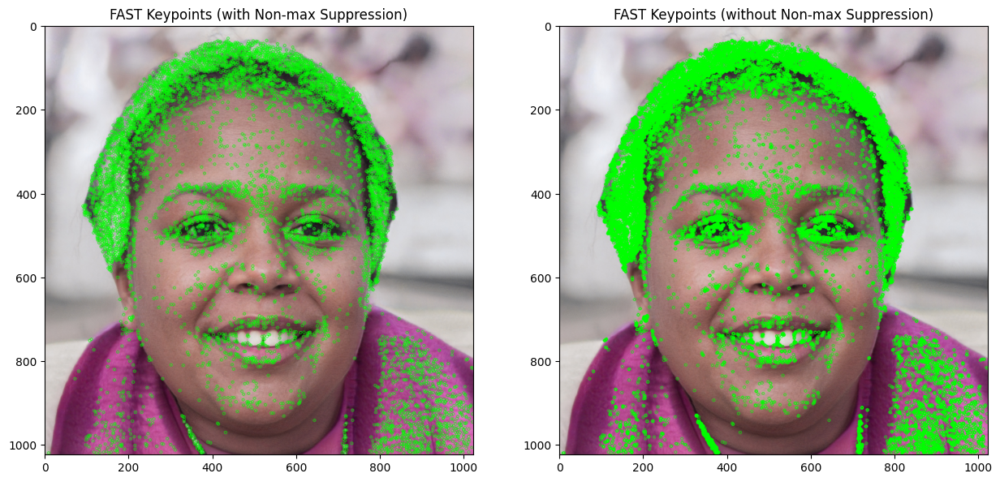

In [4]:
# b- FAST
fast = cv2.FastFeatureDetector_create()

# Find detect and compute function and apply it on top of fast
# Keypoints with nonmax suppression
keypoints_with_nonmax = fast.detect(img_gray, None)

fast.setNonmaxSuppression(False)
# Keypoints without nonmax suppression
keypoints_without_nonmax = fast.detect(img_gray, None)

image_with_nonmax = np.copy(img_rgb)
image_without_nonmax = np.copy(img_rgb)

# Draw the result
result1_fast = cv2.drawKeypoints(img_rgb, keypoints_with_nonmax, image_with_nonmax, color=(0, 255, 0))
result2_fast = cv2.drawKeypoints(img_rgb, keypoints_without_nonmax, image_without_nonmax, color=(0, 255, 0))

plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(result1_fast, cv2.COLOR_BGR2RGB))
plt.title('FAST Keypoints (with Non-max Suppression)')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(result2_fast, cv2.COLOR_BGR2RGB))
plt.title('FAST Keypoints (without Non-max Suppression)')
plt.show()

In [25]:
# Explain your understanding here:
# This part uses the FAST algorithm for high-speed corner detection.
# We compare two modes: with non-maximum suppression, which refines the detected corners by removing redundant ones, resulting in a cleaner set; and without non-maximum suppression, which shows all detected corners, highlighting the clustering that occurs without refinement.

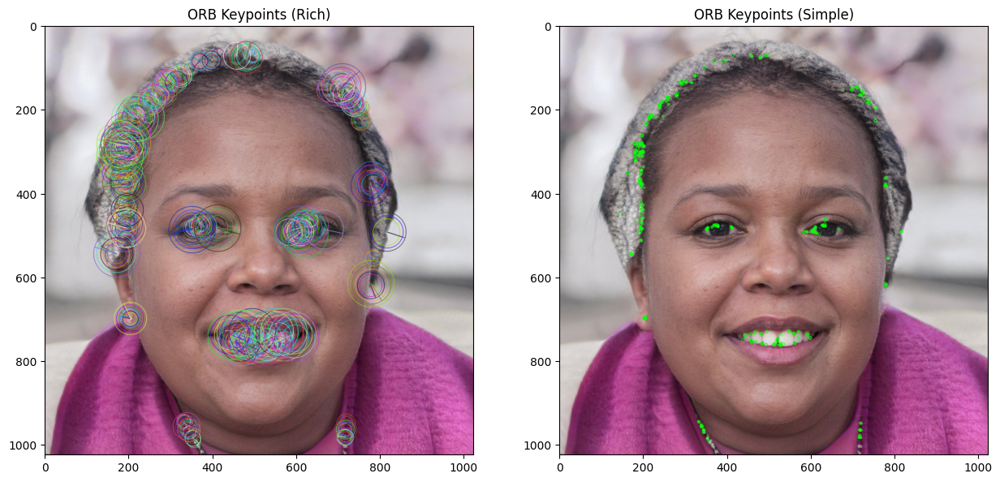

In [5]:
# c- ORB
orb = cv2.ORB_create()
original_keypoints_orb, original_descriptor_orb = orb.detectAndCompute(img_gray, None)
query_keypoints_orb, query_descriptor_orb = orb.detectAndCompute(img_gray, None) # Assuming query image is also img_gray for now

keypoints_without_size_orb = np.copy(img_rgb)
keypoints_with_size_orb = np.copy(img_rgb)

# Draw the result
result1_orb = cv2.drawKeypoints(img_rgb, original_keypoints_orb, keypoints_with_size_orb, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
result2_orb = cv2.drawKeypoints(img_rgb, original_keypoints_orb, keypoints_without_size_orb, color=(0, 255, 0))

plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(result1_orb, cv2.COLOR_BGR2RGB))
plt.title('ORB Keypoints (Rich)')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(result2_orb, cv2.COLOR_BGR2RGB))
plt.title('ORB Keypoints (Simple)')
plt.show()

In [24]:
# Explain your understanding here:
# ORB combines FAST for keypoint detection with a rotation-aware BRIEF descriptor for efficiency.
# It identifies oriented corner-like features and computes compact binary descriptors for them. The visualizations, similar to SIFT, demonstrate ORB's ability to detect keypoints with orientation, making it a balanced choice for performance and robustness.


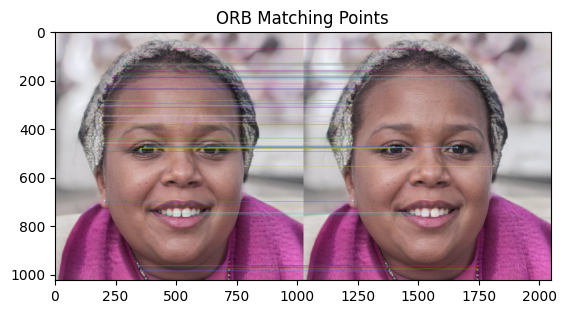

The number of matching keypoints between the original and the query image is 500


In [13]:
#d- Finding the matching points
brute_force = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# Using ORB descriptors for matching
matches = brute_force.match(original_descriptor_orb, query_descriptor_orb)
matches = sorted(matches, key=lambda x : x.distance)
# Draw top N matches
num_matches_to_draw = 50
result = cv2.drawMatches(img_rgb, original_keypoints_orb, img_rgb, query_keypoints_orb, matches[:num_matches_to_draw], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('ORB Matching Points')
plt.show()
print("The number of matching keypoints between the original and the query image is {}".format(len(matches)))

In [27]:
# Explain your understanding here. What is the goal of this matching point?
# This process identifies corresponding keypoints between images using their descriptors.
# Here, ORB descriptors are matched against themselves with a Brute-Force Matcher using Hamming distance and cross-checking for consistency. Matches are sorted by distance, and drawMatches visually connects the best correspondences, illustrating the effectiveness of feature detection and description in linking features across images for tasks like object recognition or image stitching.


**Part 2- Face recognition**

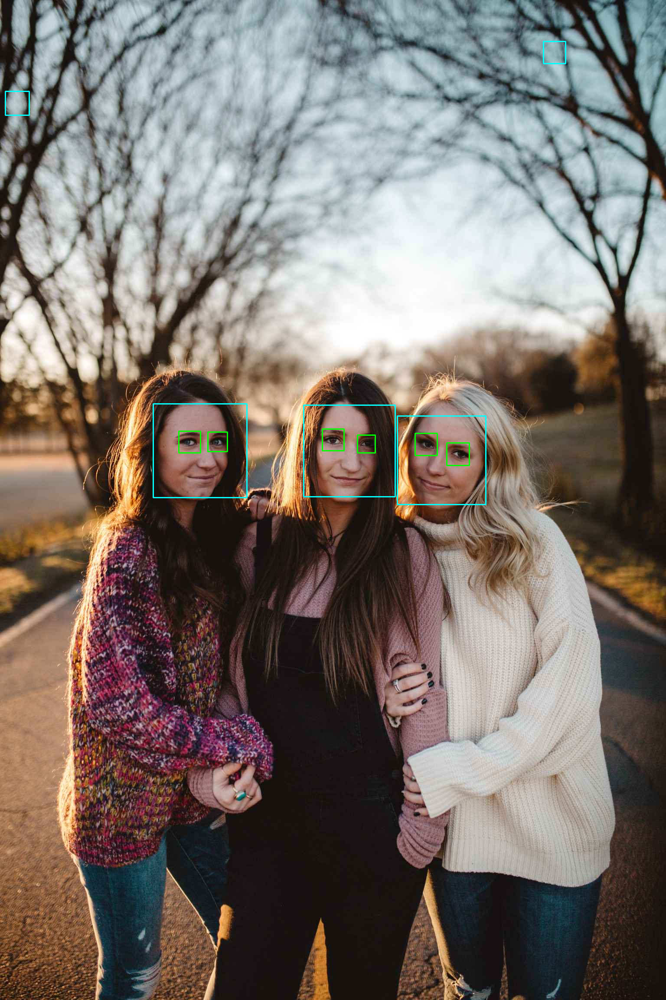

In [16]:
face_cascade = cv2.CascadeClassifier("/content/haarcascade_frontalface_default.xml")
eye_cascade = cv2.CascadeClassifier("/content/haarcascade_eye.xml")

img = cv2.imread("/content/pic2.jpg")

if img is None:
    print("Error: Could not load image 'Assignment4_pic2.jpg'. Please ensure the file exists and is accessible.")
else:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Create the gray version of image using openCV
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)

    for (x,y,w,h) in faces:
        img1 = cv2.rectangle(img,(x, y),(x + w, y + h),(255,255,0),2)
        roi_gray = gray[y: y + h, x: x + w]
        roi_color = img[y: y + h, x: x + w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(roi_color,(ex, ey), (ex + ew, ey + eh), (0,255,0),2)

    cv2_imshow(img)

In [17]:
#b- Working on webcam
#Function to activate your laptop cam. This function is comp;ete and you don't need to do anything.
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

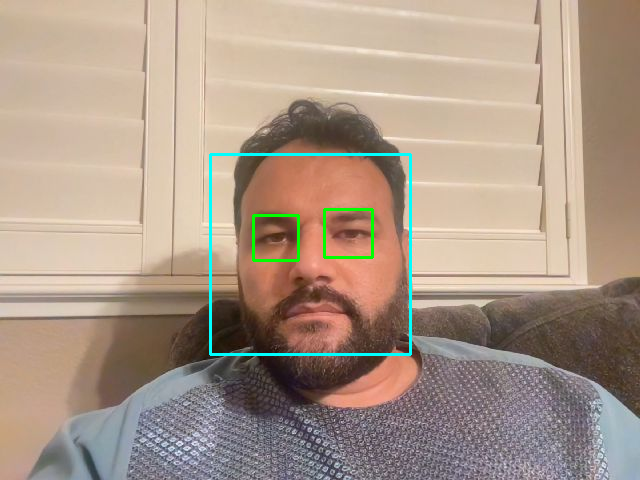

In [19]:
# Here we call the function and open the camera
# Make sure the take_photo function is defined by running cell clYu5ua5NKH_ first.

# Call function and open the camera
image_file = take_photo('my_photo.jpg')

#Show the read image
image = cv2.imread(image_file) #read the image and show it here

#Repeat the above code to detect the face and eyes in your image
face_cascade = cv2.CascadeClassifier("/content/haarcascade_frontalface_default.xml")
eye_cascade = cv2.CascadeClassifier("/content/haarcascade_eye.xml")

gray_cam = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
faces_cam = face_cascade.detectMultiScale(gray_cam, 1.3, 5)

for (x,y,w,h) in faces_cam:
    cv2.rectangle(image,(x, y),(x + w, y + h),(255,255,0),2)
    roi_gray_cam = gray_cam[y: y + h, x: x + w]
    roi_color_cam = image[y: y + h, x: x + w]
    eyes = eye_cascade.detectMultiScale(roi_gray_cam)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color_cam,(ex, ey), (ex + ew, ey + eh), (0,255,0),2)

cv2_imshow(image)

**Part 3- Parameter detection**

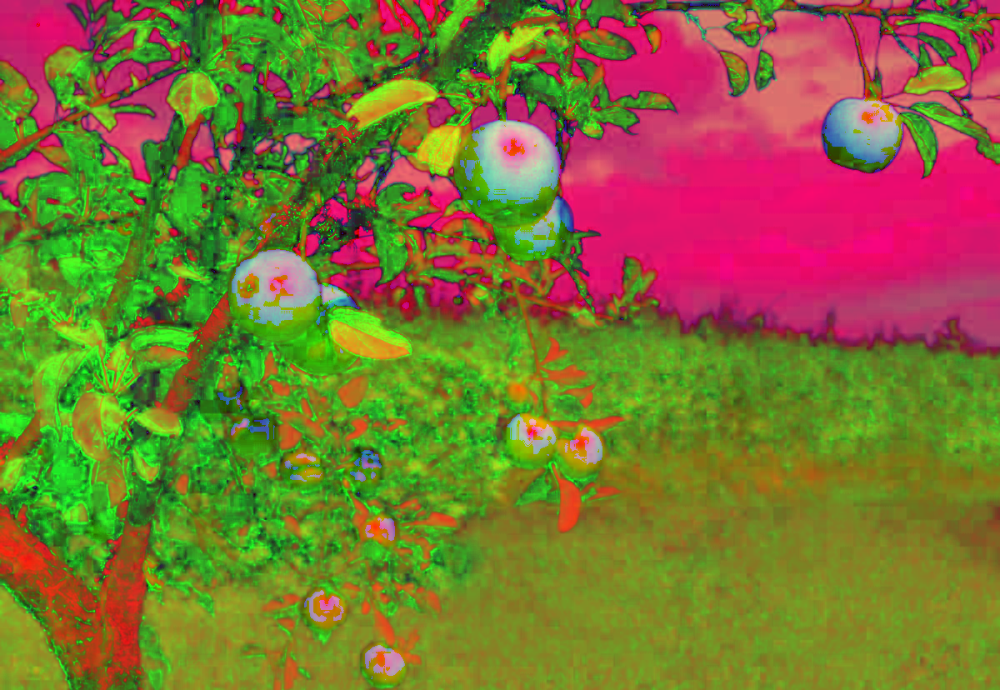

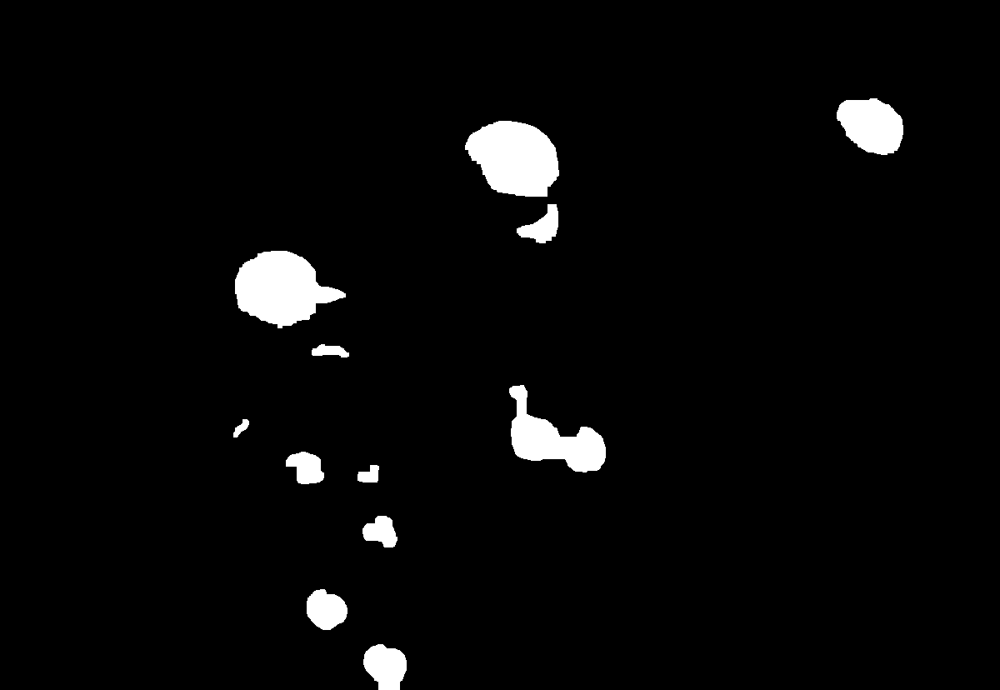

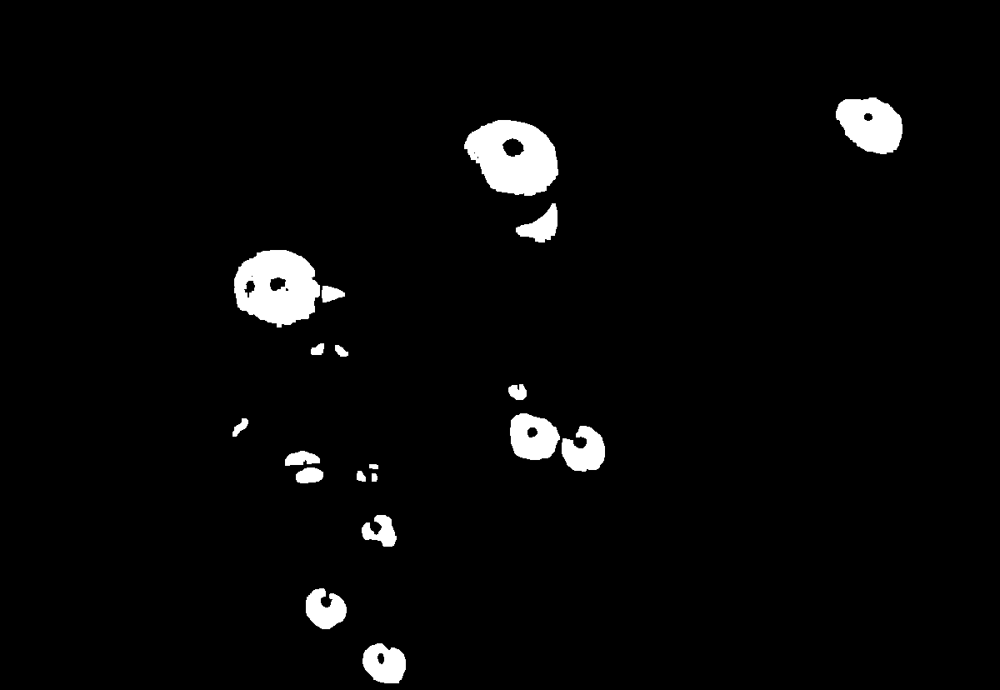

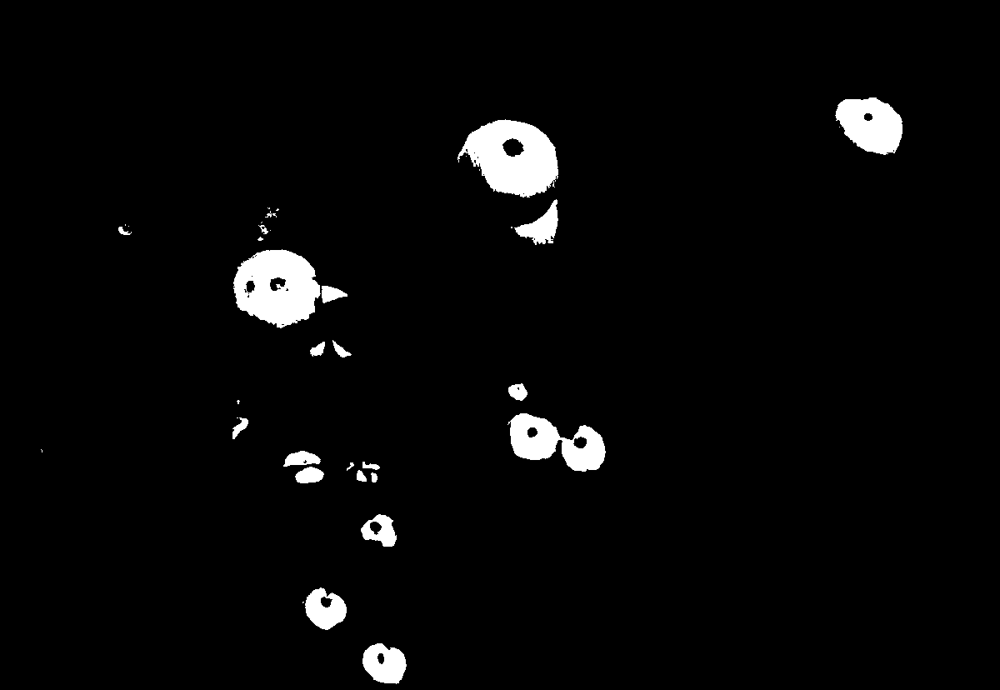

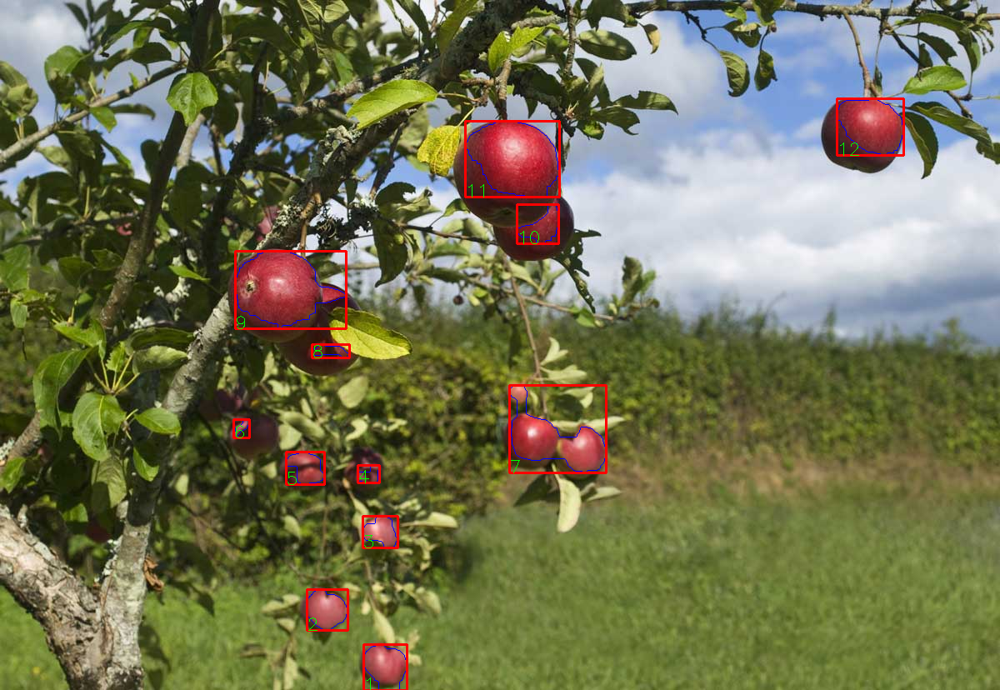

In [32]:
# Define two ranges for red color in HSV, as red wraps around the hue channel (0-10 and 160-180)
lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([160, 100, 100])
upper_red2 = np.array([180, 255, 255])

kernelOpen=np.ones((5,5))
kernelClose=np.ones((20,20))

font = cv2.FONT_HERSHEY_SIMPLEX

img=cv2.imread('/content/apple.jpg') # Reload the image to ensure fresh processing

# Convert BGR to HSV
imgHSV= cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
# Show this image
cv2_imshow(imgHSV)

# Create the masks for both red ranges
mask1 = cv2.inRange(imgHSV, lower_red1, upper_red1)
mask2 = cv2.inRange(imgHSV, lower_red2, upper_red2)

# Combine the masks
mask_red = cv2.add(mask1, mask2)

# Morphology operations on the combined mask
maskOpen=cv2.morphologyEx(mask_red,cv2.MORPH_OPEN,kernelOpen)
maskClose=cv2.morphologyEx(maskOpen,cv2.MORPH_CLOSE,kernelClose)

maskFinal=maskClose
conts,h=cv2.findContours(maskFinal.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

cv2.drawContours(img,conts,-1,(255,0,0),1)
for i in range(len(conts)):
    x,y,w,h=cv2.boundingRect(conts[i])
    cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,255), 2)
    cv2.putText(img, str(i+1),(x,y+h),cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0))

cv2_imshow(maskClose)
cv2_imshow(maskOpen)
cv2_imshow(mask_red) # Display combined red mask
cv2_imshow(img)

In [10]:
print('There were ', len(conts) ,' apples in this picture')

There were  15  apples in this picture
